# Capstone Project: The Battle of the Neighborhoods(Week 2)

# Introduction

In this project, we will try to find an optimal location for a restaurant. Specifically, this report will be targeted to stakeholders interested in opening an Chinese restaurant in the city of Toronto, Canada.

In order to achieve our goal, we will try to detect locations with low density of restaurants. Besides, locations with less or even no Chinese restaurants will seem to be great choices. Finally, population of a district will also have a great impact on restaurants operating.

We will use our data science skills to get and analyze restaurants and neighborhoods data in Toronto and finally get some advices on choosing the optimal location.

# Data

In [25]:
# import necessary modules
import pandas as pd
import requests
import math
import numpy as np
from geopy.geocoders import Nominatim
#!pip install folium
import folium
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

We will get the neighborhoods information of the city of Toronto from https://open.toronto.ca/dataset/neighbourhoods/

In [3]:
toronto = pd.read_csv('https://raw.githubusercontent.com/charlesJ721/Coursera_Capstone/master/neighborhood_coordinate.csv')
toronto.head()

,_id,AREA_ID,AREA_ATTR_ID,PARENT_AREA_ID,AREA_SHORT_CODE,AREA_LONG_CODE,AREA_NAME,AREA_DESC,X,Y,LONGITUDE,LATITUDE,OBJECTID,Shape__Area,Shape__Length,geometry
0,4621,25886861,25926662,49885,94,94,Wychwood (94),Wychwood (94),NaN,NaN,-79.425515,43.676919,16491505,3.217960e+06,7515.779658,"{u'type': u'Polygon', u'coordinates': (((-79.4..."
1,4622,25886820,25926663,49885,100,100,Yonge-Eglinton (100),Yonge-Eglinton (100),NaN,NaN,-79.403590,43.704689,16491521,3.160334e+06,7872.021074,"{u'type': u'Polygon', u'coordinates': (((-79.4..."
2,4623,25886834,25926664,49885,97,97,Yonge-St.Clair (97),Yonge-St.Clair (97),NaN,NaN,-79.397871,43.687859,16491537,2.222464e+06,8130.411276,"{u'type': u'Polygon', u'coordinates': (((-79.3..."
3,4624,25886593,25926665,49885,27,27,York University Heights (27),York University Heights (27),NaN,NaN,-79.488883,43.765736,16491553,2.541821e+07,25632.335242,"{u'type': u'Polygon', u'coordinates': (((-79.5..."
4,4625,25886688,25926666,49885,31,31,Yorkdale-Glen Park (31),Yorkdale-Glen Park (31),NaN,NaN,-79.457108,43.714672,16491569,1.156669e+07,13953.408098,"{u'type': u'Polygon', u'coordinates': (((-79.4..."


In [4]:
# seize exact information we will need
toronto_neighborhood = toronto[['AREA_SHORT_CODE','AREA_NAME','LATITUDE', 'LONGITUDE', 'Shape__Area']].set_index('AREA_SHORT_CODE')
toronto_neighborhood.head()

,AREA_NAME,LATITUDE,LONGITUDE,Shape__Area
AREA_SHORT_CODE,,,,
94,Wychwood (94),43.676919,-79.425515,3.217960e+06
100,Yonge-Eglinton (100),43.704689,-79.403590,3.160334e+06
97,Yonge-St.Clair (97),43.687859,-79.397871,2.222464e+06
27,York University Heights (27),43.765736,-79.488883,2.541821e+07
31,Yorkdale-Glen Park (31),43.714672,-79.457108,1.156669e+07


In [5]:
# we will creat a column named radius used for explored with Foursquare apis
toronto_neighborhood['Radius'] = np.sqrt(toronto_neighborhood['Shape__Area'] / math.pi)

In [6]:
toronto_neighborhood.columns = ['Neighborhood', 'Latitude', 'Longitude', 'Area', 'Radius']
toronto_neighborhood.index.name = 'Neighborhood_id'
toronto_neighborhood.head()

,Neighborhood,Latitude,Longitude,Area,Radius
Neighborhood_id,,,,,
94,Wychwood (94),43.676919,-79.425515,3.217960e+06,1012.081201
100,Yonge-Eglinton (100),43.704689,-79.403590,3.160334e+06,1002.978341
97,Yonge-St.Clair (97),43.687859,-79.397871,2.222464e+06,841.089976
27,York University Heights (27),43.765736,-79.488883,2.541821e+07,2844.445038
31,Yorkdale-Glen Park (31),43.714672,-79.457108,1.156669e+07,1918.799364


In [7]:
# The code was removed by Watson Studio for sharing.

To gather restaurants location information in Toronto, we use Foursquare api to fetch venues around every neighborhood of which category is restaurant, and specifically we identify those of chinese restaurant sub-category.

In [8]:
# find all category id that we will need from Foursquare
food_category = '4d4b7105d754a06374d81259'
chinese_restaurant_categories = ['4bf58dd8d48988d145941735',
                                '52af3a7c3cf9994f4e043bed', '58daa1558bbb0b01f18ec1d3', '4bf58dd8d48988d1f5931735', 
                                '52af3a9f3cf9994f4e043bef', '52af3aaa3cf9994f4e043bf0', '52af3ac83cf9994f4e043bf3', 
                                '52af3afc3cf9994f4e043bf8', '52af3b463cf9994f4e043bfe', '52af3b593cf9994f4e043c00', 
                                '52af3b773cf9994f4e043c03', '52af3b813cf9994f4e043c04', '52af3b913cf9994f4e043c06']

In [9]:
# define a function to get restaurants and chinese restaurants
def getRestaurants(names, latitudes, longitudes, radius, limit = 100):
    restaurants = []
    chinese_restaurants = []
    restaurant_words = ['restaurant', 'dining', 'cuisine', 'diner', 'steakhouse', 'noodle house', 'taverna']
    
    print('Begin to explore.')
    
    for name, lat, lng, r in zip(names, latitudes, longitudes, radius):
        print('{} pending...'.format(name))
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(client_id, client_secret, version, lat, lng, food_category, r, limit)
        results = requests.get(url).json()["response"]['groups'][0]['items']
        for v in results:
            for r in restaurant_words:
                if r in v['venue']['categories'][0]['name'].lower():
                    restaurants.append((name, 
                                       lat, 
                                       lng, 
                                       v['venue']['id'], 
                                       v['venue']['name'], 
                                       v['venue']['location']['lat'], 
                                       v['venue']['location']['lng'], 
                                       v['venue']['categories'][0]['name']))
                    if v['venue']['categories'][0]['id'] in chinese_restaurant_categories:
                        chinese_restaurants.append((name, 
                                                   lat, 
                                                   lng, 
                                                   v['venue']['id'], 
                                                   v['venue']['name'], 
                                                   v['venue']['location']['lat'], 
                                                   v['venue']['location']['lng'], 
                                                   v['venue']['categories'][0]['name']))
                    break
        print('{} was explored. {} restaurants loaded. {} chinese restaurants loaded.'.format(name, len(restaurants), len(chinese_restaurants)))
        
    restaurant_venues = pd.DataFrame([item for item in restaurants])
    restaurant_venues.columns = ['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude', 'Venue Id', 'Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category Name']
    chinese_restaurant_venues = pd.DataFrame([item for item in chinese_restaurants])
    chinese_restaurant_venues.columns = ['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude', 'Venue Id','Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category Name']
    
    return restaurant_venues, chinese_restaurant_venues

In [10]:
# load restaurants information
try:
    toronto_restaurant_venues = pd.read_csv('trv.csv')
    toronto_chinese_restaurant_venues = pd.read_csv('tcrv.csv')
except:
    toronto_restaurant_venues = None
    toronto_chinese_restaurant_venues = None
    while toronto_restaurant_venues is None:
        try:
            toronto_restaurant_venues, toronto_chinese_restaurant_venues = getRestaurants(names=toronto_neighborhood['Neighborhood'],
                                             latitudes=toronto_neighborhood['Latitude'],
                                             longitudes=toronto_neighborhood['Longitude'],
                                             radius=toronto_neighborhood['Radius'])
        except KeyboardInterrupt:
            break
        except:
            continue
    if not toronto_restaurant_venues is None:
        print('Collected!')
        toronto_restaurant_venues.drop_duplicates(inplace = True)
        toronto_chinese_restaurant_venues.drop_duplicates(inplace = True)
        toronto_restaurant_venues.to_csv('trv.csv', index = False)
        toronto_chinese_restaurant_venues.to_csv('tcrv.csv', index = False)

Begin to explore.
Wychwood (94) pending...
Wychwood (94) was explored. 43 restaurants loaded. 2 chinese restaurants loaded.
Yonge-Eglinton (100) pending...
Yonge-Eglinton (100) was explored. 106 restaurants loaded. 3 chinese restaurants loaded.
Yonge-St.Clair (97) pending...
Yonge-St.Clair (97) was explored. 137 restaurants loaded. 5 chinese restaurants loaded.
York University Heights (27) pending...
York University Heights (27) was explored. 195 restaurants loaded. 10 chinese restaurants loaded.
Yorkdale-Glen Park (31) pending...
Yorkdale-Glen Park (31) was explored. 246 restaurants loaded. 12 chinese restaurants loaded.
Lambton Baby Point (114) pending...
Lambton Baby Point (114) was explored. 252 restaurants loaded. 12 chinese restaurants loaded.
Lansing-Westgate (38) pending...
Lansing-Westgate (38) was explored. 294 restaurants loaded. 15 chinese restaurants loaded.
Lawrence Park North (105) pending...
Lawrence Park North (105) was explored. 315 restaurants loaded. 15 chinese rest

In [11]:
toronto_restaurant_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Id,Venue,Venue Latitude,Venue Longitude,Venue Category Name
0,Wychwood (94),43.676919,-79.425515,52418b0b7e48222eea81d2d2,Pukka Restaurant,43.681055,-79.429187,Indian Restaurant
1,Wychwood (94),43.676919,-79.425515,4aeb7abbf964a52080c221e3,Ferro Bar Cafe,43.681080,-79.428570,Italian Restaurant
2,Wychwood (94),43.676919,-79.425515,4bf1c91578cec92810d2ba86,Mi Tierra,43.680618,-79.431175,South American Restaurant
3,Wychwood (94),43.676919,-79.425515,4b5b534cf964a520b4f428e3,Churrasco of St. Clair,43.681681,-79.425453,Portuguese Restaurant
4,Wychwood (94),43.676919,-79.425515,4b003cf6f964a520d73b22e3,Vinny’s Panini,43.670679,-79.426148,Italian Restaurant


In [12]:
toronto_chinese_restaurant_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue Id,Venue,Venue Latitude,Venue Longitude,Venue Category Name
0,Wychwood (94),43.676919,-79.425515,4ce588455fce5481cd1e5caa,Cho Cho Cho,43.680139,-79.432895,Chinese Restaurant
1,Wychwood (94),43.676919,-79.425515,4b50ff62f964a520b43c27e3,Dragon Delight,43.680765,-79.431079,Chinese Restaurant
2,Yonge-Eglinton (100),43.704689,-79.403590,4c191701834e2d7f24db2980,Chinese Food Gallery,43.703347,-79.414646,Chinese Restaurant
3,Yonge-St.Clair (97),43.687859,-79.397871,52c88ab711d22e372f645af6,Kwan Restaurant,43.688737,-79.394359,Cantonese Restaurant
4,Yonge-St.Clair (97),43.687859,-79.397871,4b69b043f964a520afad2be3,Best Z,43.688604,-79.393597,Chinese Restaurant


Let's now use folium module to create a map of toronto and put the restaurant locations we got from Foursquare on it

In [13]:
# get the coordinates of Toronto
address = 'Toronto, CA'

geolocator = Nominatim(user_agent="tr_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Toronto are 43.6534817, -79.3839347.


In [14]:
# creat a map of Toronto with restaurants we loaded from Foursquare
map_toronto = folium.Map(location=[latitude+0.06, longitude], zoom_start=11)

for idx, lat, lng, venue, neighborhood in zip(toronto_restaurant_venues['Venue Id'], toronto_restaurant_venues['Venue Latitude'], toronto_restaurant_venues['Venue Longitude'], toronto_restaurant_venues['Venue'], toronto_restaurant_venues['Neighborhood']):
    label = '{}, {}'.format(neighborhood, venue)
    label = folium.Popup(label, parse_html=True)
    color = 'red' if idx in np.array(toronto_chinese_restaurant_venues['Venue Id']) else 'blue'
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=1,
        parse_html=False).add_to(map_toronto)  
    
map_toronto

In [15]:
# creat a map of Toronto with chinese restaurants we loaded from Foursquare
map_toronto = folium.Map(location=[latitude+0.06, longitude], zoom_start=11)

for idx, lat, lng, venue, neighborhood in zip(toronto_chinese_restaurant_venues['Venue Id'], toronto_chinese_restaurant_venues['Venue Latitude'], toronto_chinese_restaurant_venues['Venue Longitude'], toronto_chinese_restaurant_venues['Venue'], toronto_chinese_restaurant_venues['Neighborhood']):
    label = '{}, {}'.format(neighborhood, venue)
    label = folium.Popup(label, parse_html=True)
    color = 'red'
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=1,
        parse_html=False).add_to(map_toronto)  
    
map_toronto

In [16]:
# we will need to load population of each neighborhood
toronto_profile = pd.read_csv('https://raw.githubusercontent.com/charlesJ721/Coursera_Capstone/master/neighborhood_profile.csv')
toronto_profile.head()

,_id,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
0,1,Neighbourhood Information,Neighbourhood Information,City of Toronto,Neighbourhood Number,NaN,129,128,20,95,...,37,7,137,64,60,94,100,97,27,31
1,2,Neighbourhood Information,Neighbourhood Information,City of Toronto,TSNS2020 Designation,NaN,No Designation,No Designation,No Designation,No Designation,...,No Designation,No Designation,NIA,No Designation,No Designation,No Designation,No Designation,No Designation,NIA,Emerging Neighbourhood
2,3,Population,Population and dwellings,Census Profile 98-316-X2016001,"Population, 2016","2,731,571","29,113","23,757","12,054","30,526",...,"16,936","22,156","53,485","12,541","7,865","14,349","11,817","12,528","27,593","14,804"
3,4,Population,Population and dwellings,Census Profile 98-316-X2016001,"Population, 2011","2,615,060","30,279","21,988","11,904","29,177",...,"15,004","21,343","53,350","11,703","7,826","13,986","10,578","11,652","27,713","14,687"
4,5,Population,Population and dwellings,Census Profile 98-316-X2016001,Population Change 2011-2016,4.50%,-3.90%,8.00%,1.30%,4.60%,...,12.90%,3.80%,0.30%,7.20%,0.50%,2.60%,11.70%,7.50%,-0.40%,0.80%


In [17]:
toronto_neighborhood_profile = toronto_profile.drop(['_id', 'Category', 'Topic', 'Data Source', 'City of Toronto'], axis = 1).set_index('Characteristic').T.set_index('Neighbourhood Number')
toronto_neighborhood_profile.index = toronto_neighborhood_profile.index.astype('int64')
toronto_neighborhood_profile.head()

Characteristic,TSNS2020 Designation,"Population, 2016","Population, 2011",Population Change 2011-2016,Total private dwellings,Private dwellings occupied by usual residents,Population density per square kilometre,Land area in square kilometres,Children (0-14 years),Youth (15-24 years),...,External migrants,Total - Mobility status 5 years ago - 25% sample data,Non-movers,Movers,Non-migrants,Migrants,Internal migrants,Intraprovincial migrants,Interprovincial migrants,External migrants
Neighbourhood Number,,,,,,,,,,,,,,,,,,,,,
129,No Designation,"29,113","30,279",-3.90%,"9,371","9,120","3,929",7.41,"3,840","3,705",...,605,"27,490","18,865","8,610","5,445","3,170",880,735,135,"2,280"
128,No Designation,"23,757","21,988",8.00%,"8,535","8,136","3,034",7.83,"3,075","3,360",...,490,"22,325","13,565","8,775","5,610","3,145",980,760,220,"2,170"
20,No Designation,"12,054","11,904",1.30%,"4,732","4,616","2,435",4.95,"1,760","1,235",...,70,"11,370","8,235","3,130","2,200",925,680,615,70,245
95,No Designation,"30,526","29,177",4.60%,"18,109","15,934","10,863",2.81,"2,360","3,750",...,835,"27,715","12,980","14,735","8,340","6,390","3,930","2,630","1,310","2,460"
42,No Designation,"27,695","26,918",2.90%,"12,473","12,124","2,775",9.98,"3,605","2,730",...,380,"25,925","16,300","9,625","6,480","3,140","1,405","1,190",220,"1,735"


In [18]:
toronto_merged = toronto_neighborhood.join(toronto_neighborhood_profile[['Population, 2016']], how = 'left')
toronto_merged['Population'] = toronto_merged['Population, 2016'].str.replace(',', '').astype('int64')
toronto_merged.drop('Population, 2016', inplace = True, axis = 1)
toronto_merged.head()

,Neighborhood,Latitude,Longitude,Area,Radius,Population
Neighborhood_id,,,,,,
94,Wychwood (94),43.676919,-79.425515,3.217960e+06,1012.081201,14349
100,Yonge-Eglinton (100),43.704689,-79.403590,3.160334e+06,1002.978341,11817
97,Yonge-St.Clair (97),43.687859,-79.397871,2.222464e+06,841.089976,12528
27,York University Heights (27),43.765736,-79.488883,2.541821e+07,2844.445038,27593
31,Yorkdale-Glen Park (31),43.714672,-79.457108,1.156669e+07,1918.799364,14804


In [54]:
# creat a choropleth map of toronto population and restaurants on it
toronto_geo = r'https://raw.githubusercontent.com/charlesJ721/Coursera_Capstone/master/Neighbourhoods.json'
toronto_map = map_toronto = folium.Map(location=[latitude+0.06, longitude], zoom_start=11)
toronto_map.choropleth(
    geo_data=toronto_geo,
    data=toronto_merged,
    columns=['Neighborhood', 'Population'],
    key_on='feature.properties.AREA_NAME',
    fill_color='YlGn', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Population'
)

for idx, lat, lng, venue, neighborhood in zip(toronto_restaurant_venues['Venue Id'], toronto_restaurant_venues['Venue Latitude'], toronto_restaurant_venues['Venue Longitude'], toronto_restaurant_venues['Venue'], toronto_restaurant_venues['Neighborhood']):
    label = '{}, {}'.format(neighborhood, venue)
    label = folium.Popup(label, parse_html=True)
    color = 'red' if idx in np.array(toronto_chinese_restaurant_venues['Venue Id']) else 'blue'
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=1,
        parse_html=False).add_to(map_toronto)  
    
toronto_map

/opt/conda/envs/Python36/lib/python3.6/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


# Methodology

In previous sections, we have gathered and pre-treated data we will need to fit our model. And in this section, we will go a step further to fix our data and fit our model.

First, let's merge our neighborhoods data and restaurants data together.

In [20]:
restaurant_counts = toronto_restaurant_venues.groupby('Neighborhood').count()[['Venue']]
restaurant_counts.columns = ['Restaurants']
restaurant_counts.head()

,Restaurants
Neighborhood,
Agincourt North (129),33
Agincourt South-Malvern West (128),69
Alderwood (20),28
Annex (95),40
Banbury-Don Mills (42),49


In [21]:
chinese_restaurant_counts = toronto_chinese_restaurant_venues.groupby('Neighborhood').count()[['Venue']]
chinese_restaurant_counts.columns = ['Chinese Restaurants']
chinese_restaurant_counts.head()

,Chinese Restaurants
Neighborhood,
Agincourt North (129),9
Agincourt South-Malvern West (128),23
Alderwood (20),1
Banbury-Don Mills (42),6
Bathurst Manor (34),2


In [22]:
neighborhood_merged = toronto_merged.merge(restaurant_counts, left_on = 'Neighborhood', right_index = True, how = 'left')
neighborhood_merged = neighborhood_merged.merge(chinese_restaurant_counts, left_on = 'Neighborhood', right_index = True, how = 'left')
neighborhood_merged['Chinese Restaurants'] = neighborhood_merged['Chinese Restaurants'].fillna(0).astype('int64')
neighborhood_merged['Area'] = round(neighborhood_merged['Area']/1000000, 2)
neighborhood_merged['Radius'] = round(neighborhood_merged['Radius']/1000, 2)
neighborhood_merged.head()

,Neighborhood,Latitude,Longitude,Area,Radius,Population,Restaurants,Chinese Restaurants
Neighborhood_id,,,,,,,,
94,Wychwood (94),43.676919,-79.425515,3.22,1.01,14349,43,2
100,Yonge-Eglinton (100),43.704689,-79.403590,3.16,1.00,11817,63,1
97,Yonge-St.Clair (97),43.687859,-79.397871,2.22,0.84,12528,31,2
27,York University Heights (27),43.765736,-79.488883,25.42,2.84,27593,58,5
31,Yorkdale-Glen Park (31),43.714672,-79.457108,11.57,1.92,14804,51,2


And then we will build two columns by dividing restaurant counts by area to get density of restaurants of every neighborhood.

In [23]:
neighborhood_merged['Restaurants/km2'] = neighborhood_merged['Restaurants'] / neighborhood_merged['Area']
neighborhood_merged['Chinese Restaurants/km2'] = neighborhood_merged['Chinese Restaurants'] / neighborhood_merged['Area']
neighborhood_merged.head()

,Neighborhood,Latitude,Longitude,Area,Radius,Population,Restaurants,Chinese Restaurants,Restaurants/km2,Chinese Restaurants/km2
Neighborhood_id,,,,,,,,,,
94,Wychwood (94),43.676919,-79.425515,3.22,1.01,14349,43,2,13.354037,0.621118
100,Yonge-Eglinton (100),43.704689,-79.403590,3.16,1.00,11817,63,1,19.936709,0.316456
97,Yonge-St.Clair (97),43.687859,-79.397871,2.22,0.84,12528,31,2,13.963964,0.900901
27,York University Heights (27),43.765736,-79.488883,25.42,2.84,27593,58,5,2.281668,0.196696
31,Yorkdale-Glen Park (31),43.714672,-79.457108,11.57,1.92,14804,51,2,4.407952,0.172861


Now we can use KMeans clustering algorithm to fit our data.

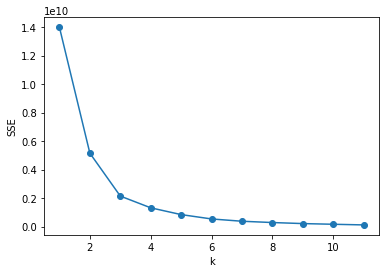

In [26]:
# first we will find a proper k value for our model
neighborhood_clustering = neighborhood_merged[['Radius', 'Population', 'Restaurants/km2', 'Chinese Restaurants/km2']]
SSE = []
for k in range(1, 12):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(neighborhood_clustering)
    SSE.append(kmeans.inertia_)
X = range(1, 12)
plt.plot(X, SSE, 'o-')
plt.xlabel('k')
plt.ylabel('SSE')
plt.show()

From the figure above we can see that when k = 3 we get an elbow

In [27]:
kclusters = 3
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(neighborhood_clustering)
kmeans.labels_[0:10]

array([0, 0, 0, 2, 0, 0, 0, 0, 0, 0], dtype=int32)

Now that we had a model and divide our data set into 3 clusters and let's see the descriptive information of different cluster.

In [28]:
neighborhood_merged['labels'] = kmeans.labels_

In [29]:
neighborhood_merged[neighborhood_merged['labels'] == 0].describe()

,Latitude,Longitude,Area,Radius,Population,Restaurants,Chinese Restaurants,Restaurants/km2,Chinese Restaurants/km2,labels
count,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.0
mean,43.700922,-79.411510,5.766118,1.296471,13257.352941,20.529412,1.329412,5.293562,0.277900,0.0
std,0.045213,0.099258,3.586378,0.395621,3137.136079,17.187058,2.072428,5.976644,0.389955,0.0
min,43.592362,-79.580445,0.810000,0.510000,6577.000000,1.000000,0.000000,0.202224,0.000000,0.0
25%,43.670886,-79.485589,3.200000,1.010000,10732.000000,7.000000,0.000000,1.336898,0.000000,0.0
50%,43.694526,-79.415342,4.750000,1.230000,13362.000000,16.000000,1.000000,2.947368,0.161031,0.0
75%,43.728489,-79.351260,7.850000,1.580000,15873.000000,28.000000,2.000000,6.885246,0.358423,0.0
max,43.802988,-79.150843,16.940000,2.320000,18675.000000,64.000000,15.000000,23.706897,1.970443,0.0


In [30]:
neighborhood_merged[neighborhood_merged['labels'] == 1].describe()

,Latitude,Longitude,Area,Radius,Population,Restaurants,Chinese Restaurants,Restaurants/km2,Chinese Restaurants/km2,labels
count,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.0
mean,43.746466,-79.324790,27.562857,2.815714,49725.714286,39.714286,3.714286,2.160997,0.219281,1.0
std,0.079289,0.126082,20.971600,0.990603,8044.959575,19.206894,3.093773,1.880402,0.227235,0.0
min,43.633463,-79.543317,9.710000,1.760000,43794.000000,19.000000,1.000000,0.263377,0.027724,1.0
25%,43.700310,-79.389343,15.385000,2.210000,43979.000000,22.500000,1.500000,1.377337,0.035622,1.0
50%,43.770602,-79.314084,23.660000,2.740000,46496.000000,36.000000,3.000000,1.746725,0.176160,1.0
75%,43.799687,-79.225551,28.330000,3.000000,51959.500000,58.000000,5.000000,2.091503,0.302409,1.0
max,43.821201,-79.186343,72.140000,4.790000,65913.000000,62.000000,9.000000,6.179197,0.655022,1.0


In [31]:
neighborhood_merged[neighborhood_merged['labels'] == 2].describe()

,Latitude,Longitude,Area,Radius,Population,Restaurants,Chinese Restaurants,Restaurants/km2,Chinese Restaurants/km2,labels
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000,48.0
mean,43.717376,-79.391126,11.418542,1.803958,26179.500000,37.020833,4.187500,4.989689,0.409700,2.0
std,0.054042,0.099979,9.039544,0.621117,4446.639022,21.163487,6.289661,5.630044,0.512000,0.0
min,43.615924,-79.596356,2.570000,0.900000,20506.000000,4.000000,0.000000,0.378788,0.000000,2.0
25%,43.671452,-79.466695,6.187500,1.400000,22160.500000,17.250000,1.000000,1.736254,0.086862,2.0
50%,43.716055,-79.382695,9.695000,1.760000,25424.000000,39.000000,2.000000,3.578019,0.217467,2.0
75%,43.761497,-79.302089,14.202500,2.122500,29249.250000,54.250000,5.000000,5.222148,0.509082,2.0
max,43.820691,-79.176676,57.750000,4.290000,36625.000000,76.000000,31.000000,25.287356,2.622577,2.0


Now with a descriptive information of our clusters above, we can obviously find that data in cluster 2 have lowest average density of both restaurants and chinese restaurants, and still a high level of average population, which perfectly meet our demands

In [32]:
optimal_neighborhoods = neighborhood_merged[neighborhood_merged['labels'] == 1]
optimal_neighborhoods

,Neighborhood,Latitude,Longitude,Area,Radius,Population,Restaurants,Chinese Restaurants,Restaurants/km2,Chinese Restaurants/km2,labels
Neighborhood_id,,,,,,,,,,,
132,Malvern (132),43.803658,-79.222517,17.03,2.33,43794,21,3,1.233118,0.176160,1
131,Rouge (131),43.821201,-79.186343,72.14,4.79,46496,19,2,0.263377,0.027724,1
77,Waterfront Communities-The Island (77),43.633880,-79.377202,25.63,2.86,65913,56,1,2.184940,0.039017,1
51,Willowdale East (51),43.770602,-79.401484,9.71,1.76,50434,60,3,6.179197,0.308960,1
137,Woburn (137),43.766740,-79.228586,23.66,2.74,53485,36,7,1.521555,0.295858,1
14,Islington-City Centre West (14),43.633463,-79.543317,31.03,3.14,43965,62,1,1.998066,0.032227,1
117,L'Amoreaux (117),43.795716,-79.314084,13.74,2.09,43993,24,9,1.746725,0.655022,1


We can see that *Willowdale East (51)* seem to be a outlier, so let's drop  from our final data.

In [33]:
optimal_neighborhoods.drop(51, inplace = True)
optimal_neighborhoods

/opt/conda/envs/Python36/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,Neighborhood,Latitude,Longitude,Area,Radius,Population,Restaurants,Chinese Restaurants,Restaurants/km2,Chinese Restaurants/km2,labels
Neighborhood_id,,,,,,,,,,,
132,Malvern (132),43.803658,-79.222517,17.03,2.33,43794,21,3,1.233118,0.176160,1
131,Rouge (131),43.821201,-79.186343,72.14,4.79,46496,19,2,0.263377,0.027724,1
77,Waterfront Communities-The Island (77),43.633880,-79.377202,25.63,2.86,65913,56,1,2.184940,0.039017,1
137,Woburn (137),43.766740,-79.228586,23.66,2.74,53485,36,7,1.521555,0.295858,1
14,Islington-City Centre West (14),43.633463,-79.543317,31.03,3.14,43965,62,1,1.998066,0.032227,1
117,L'Amoreaux (117),43.795716,-79.314084,13.74,2.09,43993,24,9,1.746725,0.655022,1


Finally let's show our final data on a chorolepth map.

In [53]:
optimal_neighborhood_venues = toronto_restaurant_venues[(toronto_restaurant_venues['Neighborhood'] == "Malvern (132)") | 
                         (toronto_restaurant_venues['Neighborhood'] == "Rouge (131)") |
                         (toronto_restaurant_venues['Neighborhood'] == "Waterfront Communities-The Island (77)") |
                         (toronto_restaurant_venues['Neighborhood'] == "Woburn (137)") |
                         (toronto_restaurant_venues['Neighborhood'] == "Islington-City Centre West (14)") |
                         (toronto_restaurant_venues['Neighborhood'] == "L'Amoreaux (117)")]

In [55]:
toronto_geo = r'https://raw.githubusercontent.com/charlesJ721/Coursera_Capstone/master/Neighbourhoods.json'
toronto_map = map_toronto = folium.Map(location=[latitude+0.06, longitude], zoom_start=11)
toronto_map.choropleth(
    geo_data=toronto_geo,
    data=optimal_neighborhoods,
    columns=['Neighborhood', 'Population'],
    key_on='feature.properties.AREA_NAME',
    fill_color='YlGn', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Population'
)

for idx, lat, lng, venue, neighborhood in zip(optimal_neighborhood_venues['Venue Id'], optimal_neighborhood_venues['Venue Latitude'], optimal_neighborhood_venues['Venue Longitude'], optimal_neighborhood_venues['Venue'], optimal_neighborhood_venues['Neighborhood']):
    label = '{}, {}'.format(neighborhood, venue)
    label = folium.Popup(label, parse_html=True)
    color = 'red' if idx in np.array(toronto_chinese_restaurant_venues['Venue Id']) else 'blue'
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=1,
        parse_html=False).add_to(map_toronto)  
    
toronto_map

# Results and Discussion

We have analyze all 140 neighborhoods in the city of Toronto with venues around them, specially focusing on restaurants and chinese restaurants. we use KMeans Clustering algorithm to determine which neighborhoods have lowest density of both restaurants and chinese restaurants and also a higher level of population. And finally we've got a cluster of 7 neighborhoods which meet our demands. Within those 7 neighborhoods we find there being a outlier so we dropped it and finally we got 6 neighborhoods which can be optimal locations for opening a new restaurants.

Yet this doesn't mean that these 6 neighborhoods are definately most ideal location for a new restaurant to open because we just focus on 3 main elements we thought to be critical. Therefore, there could be some other neighborhoods can also be a proper loction for a new restaurant.

Besides, in this project radius we used to explore a neighborhood is somehow not that adequate so it may lead to some biases.

# Conclusion

Purpose of this project was to identify Toronto neighborhoods with low number of restaurants (particularly Chinese restaurants) and high population in order to aid stakeholders in narrowing down the search for optimal location for a new Chinese restaurant. By exploring restaurant venues distribution of every neighborhood of Toronto, we use KMeans Clustering algorithm to find out neighborhoods with lowest average density of restaurants (and Chinese restaurants) and also population in that neighborhood, and finally get 6 optimal locations for opening a new chinese restaurant.

Final decission on optimal restaurant location will be made by stakeholders based on specific characteristics of neighborhoods, taking into consideration additional factors like attractiveness of each location (proximity to park or water), levels of noise / proximity to major roads, real estate availability, prices, social and economic dynamics of every neighborhood etc.